# YOLOv8

## 0. Importing libraries

import necessary libraries and modules and sets environment variables.

* Importing Libraries:
   - `os` module provides a way to interact with the operating system.
   - `PIL` (Python Imaging Library) provides image processing capabilities.
   - `ast` module is used for parsing Python literal structures.
   - `torch` is a popular machine learning library.
   - `tensorboard` is used for visualization and monitoring of training models.
   - `PIL.Image` is a module within PIL for working with images.
   - `glob` is used for file pattern matching.
   - `Path` from `pathlib` provides an object-oriented interface to filesystem paths.
   - `numpy` is a library for numerical operations.
   - `pandas` is used for data manipulation and analysis.
   - `IPython.display` allows for displaying images and other media types in IPython.

* Setting Environment Variables:
   - `os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'` sets the minimum log level for TensorFlow to 2, which silences TensorFlow warnings.

The code snippet is preparing the environment and importing required libraries for further operations. It sets up the necessary dependencies and configurations to ensure smooth execution of subsequent code.


In [12]:
import os, PIL, ast, torch, tensorboard
import PIL.Image

from glob import glob
from pathlib import Path

import numpy as np
import pandas as pd

from IPython.display import Image, clear_output
from utils import getBounds, getHeight, getWidth

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # silence tf warnings

## 1. Data preprocessing

visualize the annotated bounding boxes on a random selection of three images from your dataset, helping you verify the correctness of the annotations before training your model.

1. It then specifies the path to the YAML file containing the dataset configuration, `dataset.yaml`. This file contains information about the paths to the training images and their corresponding label files.

2. The code loads the dataset configuration from the YAML file using the `yaml.safe_load()` function. This configuration is stored in the dataset_config variable.

3. Next, it extracts the paths to the training images and the corresponding label files from the dataset configuration.

4. The code retrieves a list of image files in the training path using `os.listdir()`. These files represent the images that will be randomly selected for annotation visualization.

5. It randomly selects three images from the list of image files using the `random.sample()` function.

6. The code then iterates over the randomly selected image files.

7. For each image file, it loads the image using the `Image.open()` function from the `PIL` library. This allows the code to work with the image and apply annotations.

8. The corresponding label file path is determined by replacing the "*images*" directory with "*labels*" in the image file path.

9. The bounding box coordinates are read from the label file using the `open()` function and `readlines()` method. These coordinates represent the location and size of the objects of interest in the image.

10. The bounding box coordinates are prepared for plotting by converting them from normalized values to pixel coordinates based on the image size.

11. The code uses the `ImageDraw.Draw()` function from `PIL` to draw bounding boxes on the image. It iterates over the bounding box coordinates and draws a rectangle for each bounding box.

12. Finally, the annotated image is displayed using `display()` from `IPython.display`. The image will be shown with the bounding boxes in the output of the code cell when executed in an IPython environment.

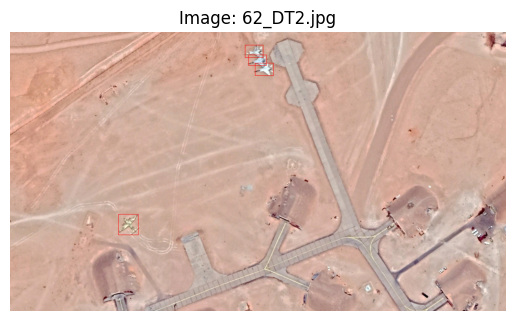

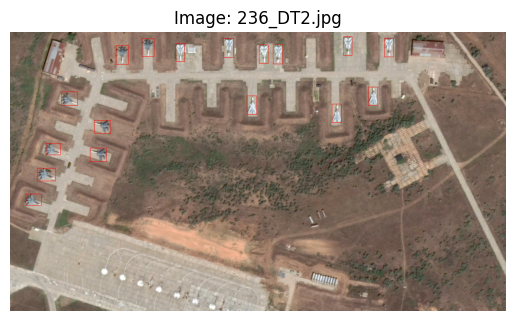

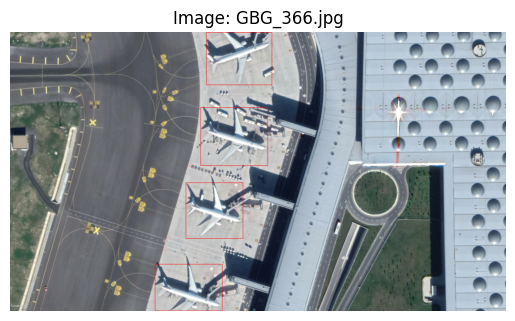

In [7]:
import yaml
import os
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

# Specify the path to the YAML file
yaml_file_path = './data/HRPlanesv2/dataset.yaml'

# Load the YAML file
with open(yaml_file_path, 'r') as f:
    dataset_config = yaml.safe_load(f)

# Get the train and labels paths from the dataset configuration
train_path = dataset_config['train']
labels_path = dataset_config['train'].replace('images', 'labels')

# Get a list of image files in the train path
image_files = os.listdir(train_path)

# Randomly select 3 images
random_images = random.sample(image_files, 3)

# Iterate over the randomly selected images
for image_file in random_images:
    # Load the image
    image_path = os.path.join(train_path, image_file)
    image = Image.open(image_path)

    # Load the corresponding label file
    label_file = os.path.splitext(image_file)[0] + '.txt'
    label_path = os.path.join(labels_path, label_file)

    # Read the bounding box coordinates from the label file
    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Prepare the bounding box coordinates for plotting
    bboxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        xmin = int((x_center - width / 2) * image.width)
        ymin = int((y_center - height / 2) * image.height)
        xmax = int((x_center + width / 2) * image.width)
        ymax = int((y_center + height / 2) * image.height)
        bboxes.append((xmin, ymin, xmax, ymax))

    # Draw bounding boxes on the image
    draw = ImageDraw.Draw(image)
    for bbox in bboxes:
        draw.rectangle(bbox, outline='red', width=4)

    # Plot the image with bounding boxes
    plt.imshow(image)
    plt.title(f'Image: {image_file}')
    plt.axis('off')
    plt.show()


## 2. Training
To train the YOLOv8 network we need to import it and specify the required parameters.
Parameters:  
 - model:      the default model .yaml config file or the .pt model (if using a pretrained model)
 - data:       the localisation of the dataset.yaml we defined earlier
 - imgsz:      the image size, here our 512x tiles
 - project:    where the training experiments data will be saved (here under the ./runs/train/ subfolder in the current directory)
 - batch-size: useful on larger datasets
 - epochs:     training steps

In [1]:
from ultralytics import YOLO

datapath = "./data/HRPlanesv2/dataset.yaml"

model = YOLO(model = "yolov8x.yaml") # Training froms sratch a new model, v8x is the largest
model.train(data = datapath, imgsz=512, project = "./runs/exp", epochs = 500, batch = 16)


                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics.nn.modules.conv.Conv             [640

RuntimeError: Dataset 'data/HRPlanesv2/dataset.yaml' error ❌ './data/HRPlanesv2/dataset.yaml' does not exist

In [9]:
from ultralytics import YOLO

trained_model = YOLO(model="runs/exp/train2/weights/best.pt")
results = trained_model(source="./data/HRPlanesv2/unseen/", imgsz = 1024, conf = 0.1, save = True,
                        save_txt = True, save_conf = True, project = "./runs/exp_")  # predict on unseen images


image 1/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/012_set2.jpg: 608x1024 9 Aircrafts, 68.5ms
image 2/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/022f91f0-1434-401f-a11b-e315b7068100.jpg: 1024x1024 26 Aircrafts, 30.8ms
image 3/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/08a8132a-a6c7-4cab-adee-7e2976fd2822.jpg: 1024x1024 29 Aircrafts, 30.5ms
image 4/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/110_set2.jpg: 608x1024 12 Aircrafts, 17.9ms
image 5/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/118_set2.jpg: 608x1024 9 Aircrafts, 17.4ms
image 6/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/126_set2.jpg: 608x1024 9 Aircrafts, 17.4ms
image 7/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/138_set1.jpg: 608x1024 6 Aircrafts, 17.5ms
image 8/22 /home/safouane/Downloads/benchmark_aircraft/data/HRPlanesv2/unseen/151_set2.jpg:

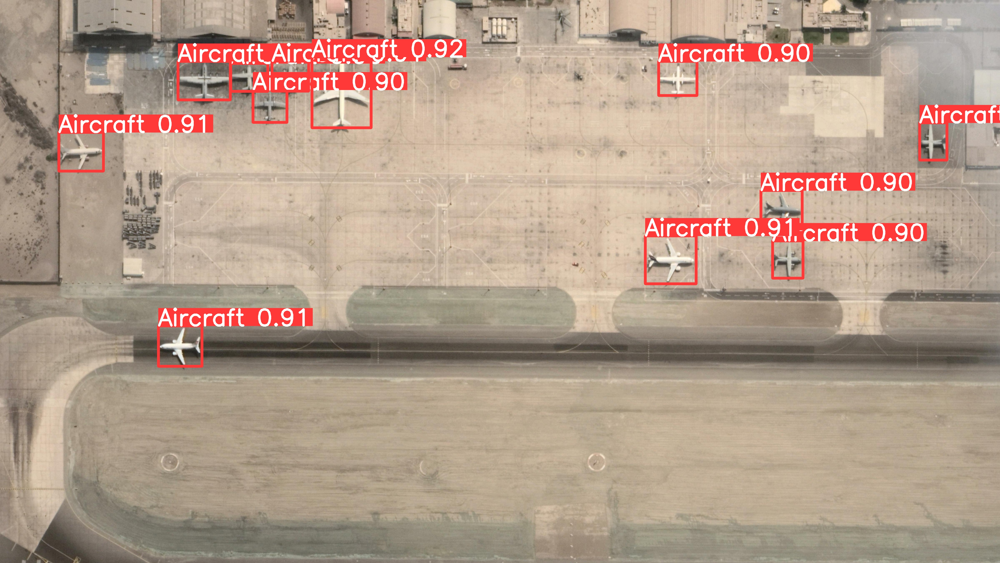

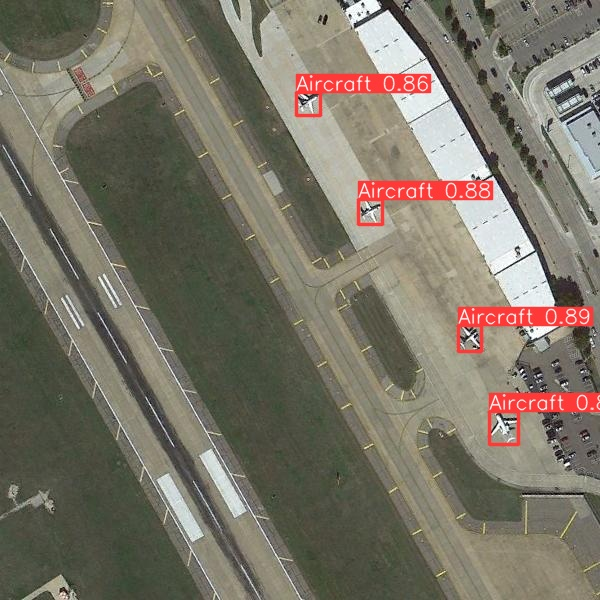

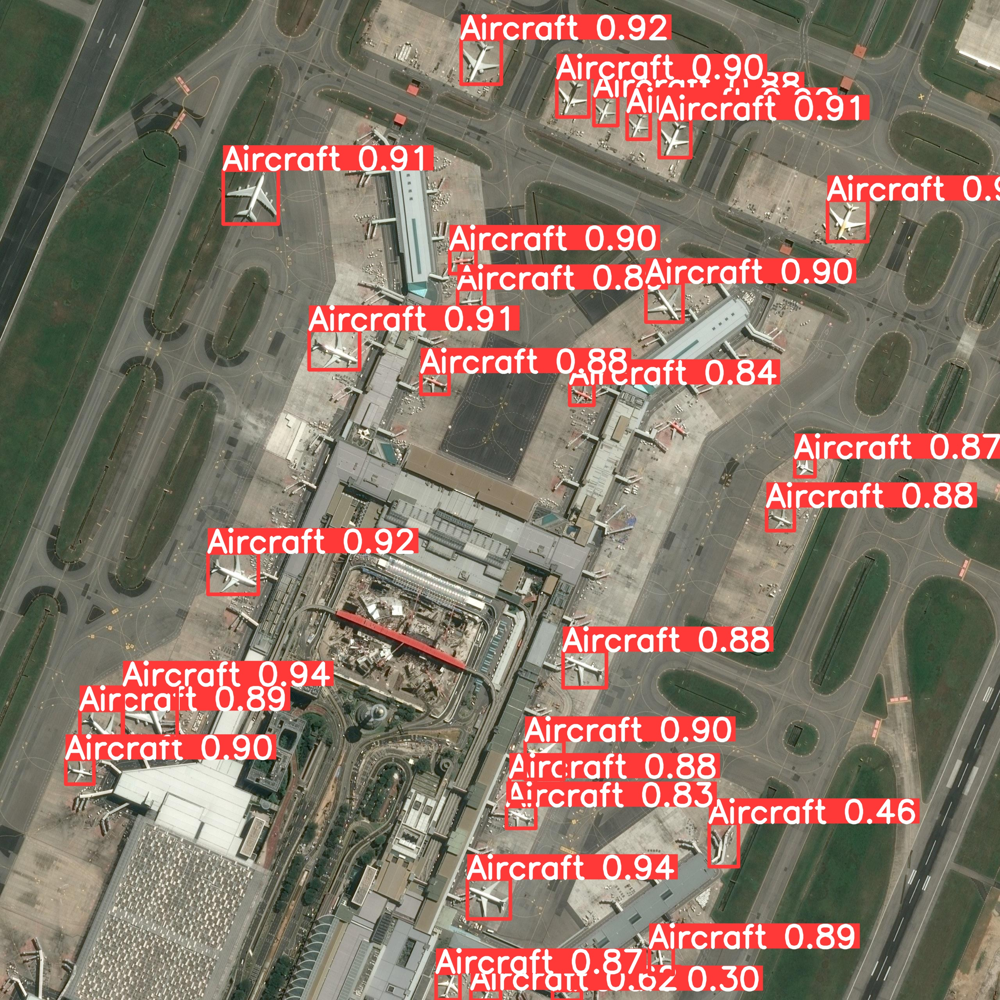

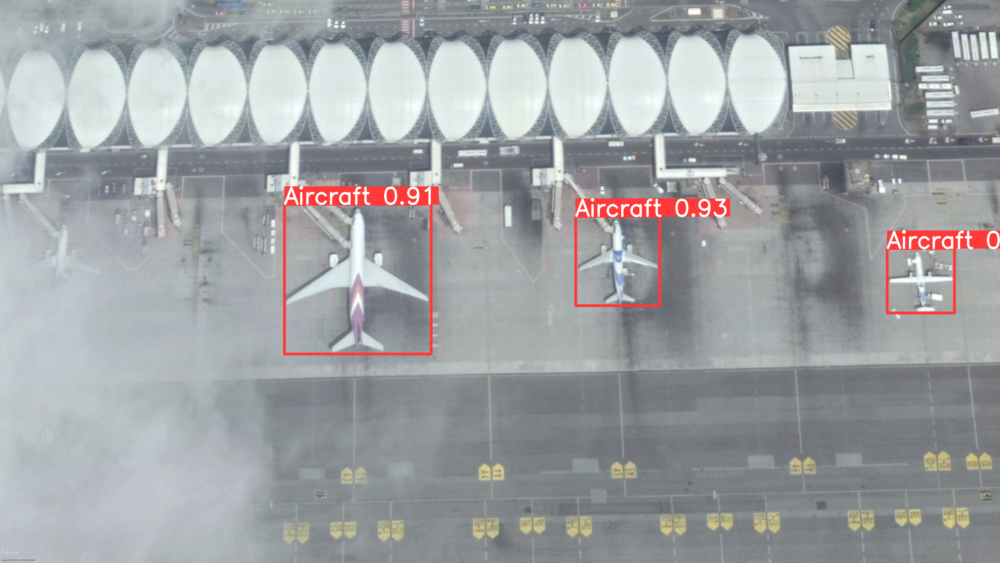

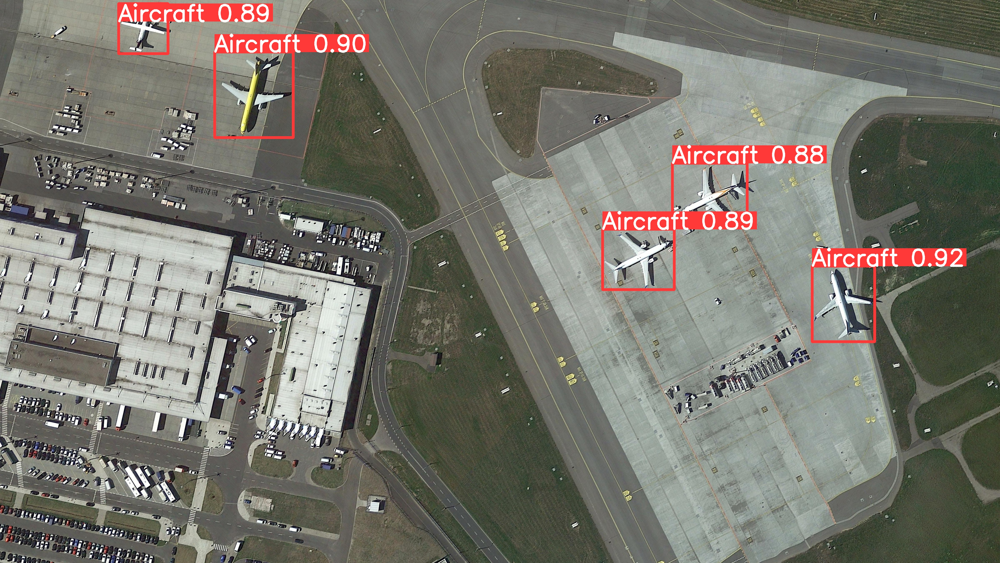

In [13]:
from glob import glob
from IPython.display import display

for image_path in glob('./runs/exp_/predict2/*.jpg')[:5]:
      display(Image(filename=image_path, width=512))